In [ ]:
!python -m pip install -r requirements.txt

In [1]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import ransac
from skimage.transform import ProjectiveTransform, AffineTransform

In [5]:
brisk = cv2.BRISK_create()

sift = cv2.xfeatures2d.SIFT_create()

orb = cv2.ORB_create()

akaze = cv2.AKAZE_create()

# surf = cv2.xfeatures2d.SURF_create(100)

# surf = cv2.xfeatures2d.SURF_create(400)

In [9]:
im1_src = "test1/imgs/0001.jpg"
# im2_src = "test/imgs/0852.jpg"
im2_src = "test1/imgs/0897.jpg"
im1 = cv2.imread(im1_src)
im2 = cv2.imread(im2_src)


norm = cv2.NORM_HAMMING
kp1, des1 = brisk.detectAndCompute(im1, None)
skp1, _ = sift.detectAndCompute(im1, None)
# okp1, _ = orb.detectAndCompute(im1, None)
okp1, _ = akaze.detectAndCompute(im1, None)

kp2, des2 = brisk.detectAndCompute(im2, None)
skp2, _ = sift.detectAndCompute(im2, None)
# okp2, _ = orb.detectAndCompute(im2, None)
okp2, _ = akaze.detectAndCompute(im2, None)

In [4]:
fig = plt.figure(figsize=(100,70))
res1 = cv2.drawKeypoints(im1, kp1, None)
sres1 = cv2.drawKeypoints(im1, skp1, None)
ores1 = cv2.drawKeypoints(im1, okp1, None)
fig.add_subplot(3, 1, 1)
plt.imshow(res1)
fig.add_subplot(3, 1, 2)
plt.imshow(sres1)
fig.add_subplot(3, 1, 3)
plt.imshow(ores1)

NameError: name 'kp1' is not defined

<Figure size 10000x7000 with 0 Axes>

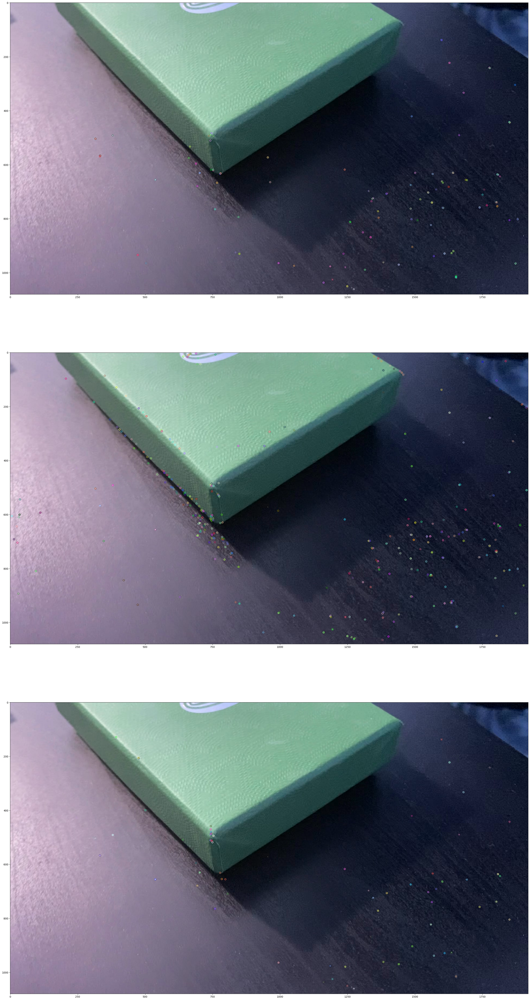

In [55]:
fig = plt.figure(figsize=(100,70))
res2 = cv2.drawKeypoints(im2, kp2, None)
sres2 = cv2.drawKeypoints(im2, skp2, None)
ores2 = cv2.drawKeypoints(im2, okp2, None)

fig.add_subplot(3, 1, 1)
plt.imshow(res2)
fig.add_subplot(3, 1, 2)
plt.imshow(sres2)
fig.add_subplot(3, 1, 3)
plt.imshow(ores2)

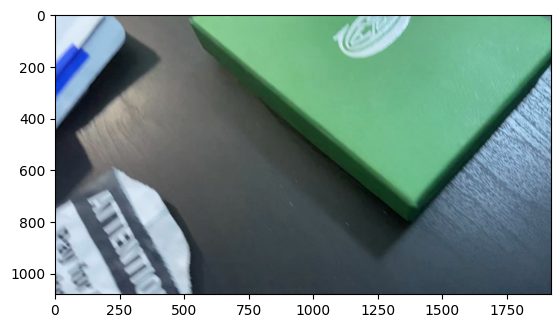

In [18]:
plt.imshow(im2)

In [13]:

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)

# Lowe's Ratio test
good = []
for m, n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1, 2)
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1, 2)


model, inliers = ransac(
    (src_pts, dst_pts),
    AffineTransform, min_samples=4,
    residual_threshold=8, max_trials=10000
)

n_inliers = np.sum(inliers)

inlier_keypoints_left = [cv2.KeyPoint(point[0], point[1], 1) for point in src_pts[inliers]]
inlier_keypoints_right = [cv2.KeyPoint(point[0], point[1], 1) for point in dst_pts[inliers]]
placeholder_matches = [cv2.DMatch(idx, idx, 1) for idx in range(n_inliers)]

im3 = cv2.drawMatches(im1, inlier_keypoints_left, im2, inlier_keypoints_right, placeholder_matches, None)


error: OpenCV(4.9.0) /Users/xperience/GHA-OpenCV-Python2/_work/opencv-python/opencv-python/opencv/modules/flann/src/miniflann.cpp:336: error: (-210:Unsupported format or combination of formats) in function 'buildIndex_'
> type=0
> 